## Steps for Applied Machine Learning (ML) for Hackathons :

1.  Understand the Problem Statement & Import Packages and Datasets.  

2.  Perform EDA (Exploratory Data Analysis) - Understanding the Datasets :

       *       Explore Train and Test Data and get to know what each Column / Feature denotes.
       *       Check for Imbalance of Target Column in Datasets.
       *       Visualize Count Plots & Unique Values to infer from Datasets.
            
3.  Check Duplicate Rows from Train Data if present.

4.  Fill/Impute Missing Values Continuous - Mean/Median/Any Specific Value & Categorical - Others/ForwardFill/BackFill.

5.  Feature Engineering 

      *       Feature Selection - Selection of Most Important Existing Features.
      *       Feature Creation  - Creation  of New Feature from the Existing Features.
      
6.  Split Train Data into Predictors(Independent) & Target(Dependent).      
7.  Data Encoding - Label Encoding, OneHot Encoding and Data Scaling - MinMaxScaler, StandardScaler, RobustScaler
8.  Create Baseline ML Model for Binary Classification Problem.
9.  Improve ML Model with Voting Classifier with MODEL Evaluation METRIC - "F1" and Predict Target "is_promoted".
10. Result Submission, Check Leaderboard & Improve "F1" Score

## 1.  Understand the Problem Statement & Import Packages and Datasets :

In [23]:
# Warning Libraries :
import warnings
warnings.filterwarnings("ignore")

# Scientific and Data Manipulation Libraries :
import pandas as pd
import numpy as np
import math
import gc
import os

# ML Libraries :
from sklearn.preprocessing            import LabelEncoder, OneHotEncoder 
from sklearn.preprocessing            import StandardScaler, MinMaxScaler, Normalizer, RobustScaler, MaxAbsScaler
from sklearn.model_selection          import KFold, StratifiedKFold, train_test_split, cross_val_score
from sklearn.tree                     import DecisionTreeClassifier
from sklearn.ensemble                 import VotingClassifier, RandomForestClassifier
from sklearn.metrics                  import f1_score, confusion_matrix, classification_report

# Boosting Algorithms :
from xgboost                          import XGBClassifier
from catboost                         import CatBoostClassifier
from lightgbm                         import LGBMClassifier

# Data Visualization Libraries :
import seaborn as sns
import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px

In [24]:
np.random.seed(0)

In [25]:
# Set Location path :
import os

os.chdir(r"C:/Users/LD196YS/Desktop/Others/0.                          Winning_Kaggle/1. AV - Hackathon/0.    OLD - HR - New Pipeline CODE/")

In [26]:
train = pd.read_csv('1. Data/train.csv')
test = pd.read_csv('1. Data/test.csv')

# Look at the head() of the data

display('Train Head :',train)
display('Test Head :',test.head())

'Train Head :'

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0


'Test Head :'

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.0,5,0,0,51
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.0,4,0,0,47
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.0,9,0,0,65
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61


## 2.  Perform EDA (Exploratory Data Analysis) - Understanding the Datasets :

In [27]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [28]:
def display_unique(data):
    for column in data.columns :
        
        print("No of Unique Values in "+column+" Column are : "+str(data[column].nunique()))
        print("Actual Unique Values in "+column+" Column are : "+str(data[column].sort_values(ascending=True,na_position='last').unique() ))
        print("")
display_unique(train)

No of Unique Values in employee_id Column are : 54808
Actual Unique Values in employee_id Column are : [    1     2     4 ... 78296 78297 78298]

No of Unique Values in department Column are : 9
Actual Unique Values in department Column are : ['Analytics' 'Finance' 'HR' 'Legal' 'Operations' 'Procurement' 'R&D'
 'Sales & Marketing' 'Technology']

No of Unique Values in region Column are : 34
Actual Unique Values in region Column are : ['region_1' 'region_10' 'region_11' 'region_12' 'region_13' 'region_14'
 'region_15' 'region_16' 'region_17' 'region_18' 'region_19' 'region_2'
 'region_20' 'region_21' 'region_22' 'region_23' 'region_24' 'region_25'
 'region_26' 'region_27' 'region_28' 'region_29' 'region_3' 'region_30'
 'region_31' 'region_32' 'region_33' 'region_34' 'region_4' 'region_5'
 'region_6' 'region_7' 'region_8' 'region_9']

No of Unique Values in education Column are : 3
Actual Unique Values in education Column are : ["Bachelor's" 'Below Secondary' "Master's & above" nan]

No 

In [29]:
# help(px.colors.sequential)
fig = px.parallel_categories(train[['department','education','gender','previous_year_rating','KPIs_met >80%',
                                   'is_promoted']], 
                             color="is_promoted", 
                             color_continuous_scale=px.colors.sequential.Aggrnyl  )
fig.show()

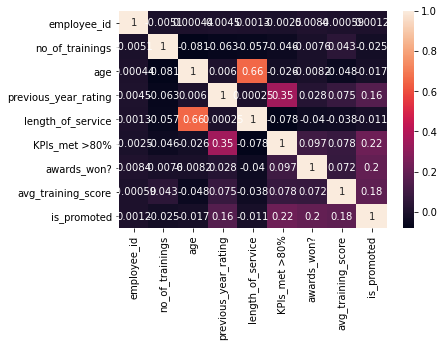

In [30]:
sns.heatmap(train.corr(), annot = True)

## 3.  Check for Duplicate Rows from Train Data if present :

In [31]:
# Later

## 4.  Fill/Impute Missing Values :
## Continuous - Mean/Median/Zero(Specific Value) | Categorical - Forward/BackFill/Others :

In [32]:
# Filling Missing Values in Train and Test :

display(train.isnull().sum())

train["previous_year_rating"] = train["previous_year_rating"].fillna(0)
test["previous_year_rating"] = test["previous_year_rating"].fillna(0)

train = train.ffill(axis = 0)
train = train.bfill(axis = 0)

display(test.isnull().sum())

test = test.ffill(axis = 0)
test = test.bfill(axis = 0)

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

employee_id                0
department                 0
region                     0
education               1034
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

## 5.  Feature Engineering :

In [33]:
# Binning :
train['age'] = pd.cut( x=train['age'], bins=[20, 29, 39, 49], labels=['20', '30', '40'] )
test['age']  = pd.cut(x=test['age'], bins=[20, 29, 39, 49], labels=['20', '30', '40'] )

## 6. Split Train Data into Predictors(Independent) & Target(Dependent) :

In [34]:
# Split train into X_train (Predictors) and y_train (Target) :

X_train = train[[ "department", "region", "education", "gender", 
                 "recruitment_channel", "no_of_trainings", "age", "previous_year_rating", 
                 "length_of_service", "KPIs_met >80%", "awards_won?", "avg_training_score" ]]

y_train = train['is_promoted']
y_train = y_train.to_frame()

X_test = test[[ "department", "region", "education", "gender", 
               "recruitment_channel", "no_of_trainings", "age", "previous_year_rating", 
               "length_of_service", "KPIs_met >80%", "awards_won?", "avg_training_score" ]]

## 7.1  Data Encoding : Label Encoding, OneHot Encoding &
## 7.2  Data Scaling : MinMaxScaler, StandardScaler, RobustScaler :

In [35]:
def data_encoding( encoding_strategy , encoding_data , encoding_columns ):
    
    if encoding_strategy == "LabelEncoding":
        print("IF LabelEncoding")
        Encoder = LabelEncoder()
        for column in encoding_columns :
            print("column",column )
            encoding_data[ column ] = Encoder.fit_transform(tuple(encoding_data[ column ]))
        
    elif encoding_strategy == "OneHotEncoding":
        print("ELIF OneHotEncoding")
        encoding_data = pd.get_dummies(encoding_data)
        
    dtypes_list =['float64','float32','int64','int32']
    encoding_data.astype( dtypes_list[0] ).dtypes
    
    return encoding_data

In [36]:
encoding_columns  = [ "region", "age","department", "education", "gender", "recruitment_channel" ]
encoding_strategy = [ "LabelEncoding", "OneHotEncoding"]

X_train_encode = data_encoding( encoding_strategy[1] , X_train , encoding_columns )
X_test_encode =  data_encoding( encoding_strategy[1] , X_test , encoding_columns )

display(test.isnull().sum())

ELIF OneHotEncoding
ELIF OneHotEncoding


employee_id                0
department                 0
region                     0
education                  0
gender                     0
recruitment_channel        0
no_of_trainings            0
age                     1504
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

In [37]:
display(X_train_encode.head())
display(X_test_encode.head())

,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,department_Legal,...,education_Below Secondary,education_Master's & above,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40
0,1,5.0,8,1,0,49,0,0,0,0,...,0,1,1,0,0,0,1,0,1,0
1,1,5.0,4,0,0,60,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
2,1,3.0,7,0,0,50,0,0,0,0,...,0,0,0,1,0,0,1,0,1,0
3,2,1.0,10,0,0,50,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
4,1,3.0,2,0,0,73,0,0,0,0,...,0,0,0,1,1,0,0,0,0,1


,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,department_Legal,...,education_Below Secondary,education_Master's & above,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40
0,1,0.0,1,1,0,77,0,0,0,0,...,0,0,0,1,0,0,1,1,0,0
1,1,3.0,5,0,0,51,0,0,1,0,...,0,0,1,0,1,0,0,0,1,0
2,1,1.0,4,0,0,47,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
3,3,2.0,9,0,0,65,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
4,1,4.0,7,0,0,61,0,1,0,0,...,0,0,0,1,0,0,1,0,1,0


In [38]:
def data_scaling( scaling_strategy , scaling_data , scaling_columns ):
    
    if    scaling_strategy =="RobustScaler" :
        scaling_data[scaling_columns] = RobustScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="StandardScaler" :
        scaling_data[scaling_columns] = StandardScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="MinMaxScaler" :
        scaling_data[scaling_columns] = MinMaxScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="MaxAbsScaler" :
        scaling_data[scaling_columns] = MaxAbsScaler().fit_transform(scaling_data[scaling_columns])
        
    else :  # If any other scaling send by mistake still perform Robust Scalar
        scaling_data[scaling_columns] = RobustScaler().fit_transform(scaling_data[scaling_columns])
    
    return scaling_data

In [39]:
scaling_strategy = ["RobustScaler", "StandardScaler","MinMaxScaler","MaxAbsScaler"]
X_train_scale = data_scaling( scaling_strategy[0] , X_train_encode , X_train_encode.columns )
X_test_scale  = data_scaling( scaling_strategy [0] , X_test_encode  , X_test_encode.columns )

## 8.  Create Baseline ML Model for Binary Classification Problem :

In [40]:
Classifiers = {'0._XGBoost' : XGBClassifier(learning_rate =0.1, n_estimators=494, max_depth=5,subsample = 0.70, verbosity = 0,
                                            scale_pos_weight = 2.5,updater ="grow_histmaker",base_score  = 0.2),
               
               '1.CatBoost' : CatBoostClassifier(learning_rate=0.15, n_estimators=494, subsample=0.085, 
                                                 max_depth=5, scale_pos_weight=2.5),
               
               '2.LightGBM' : LGBMClassifier(subsample_freq = 2, objective ="binary",importance_type = "gain",
                                             verbosity = -1, max_bin = 60,num_leaves = 300,
                                             boosting_type = 'dart',learning_rate=0.15, 
                                             n_estimators=494, max_depth=5, scale_pos_weight=2.5)
 }

print( list(Classifiers.keys()) )
print( list(Classifiers.values()) )

['0._XGBoost', '1.CatBoost', '2.LightGBM']
[XGBClassifier(base_score=0.2, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=0.1, max_delta_step=None, max_depth=5,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=494, n_jobs=None, num_parallel_tree=None,
              objective='binary:logistic', random_state=None, reg_alpha=None,
              reg_lambda=None, scale_pos_weight=2.5, subsample=0.7,
              tree_method=None, updater='grow_histmaker',
              validate_parameters=None, verbosity=0), <catboost.core.CatBoostClassifier object at 0x000001B7228A4648>, LGBMClassifier(boosting_type='dart', class_weight=None, colsample_bytree=1.0,
               importance_type='gain', learning_rate=0.15, max_bin=60,
               max_depth=5, min_child_samples=20, 

## 9.  Improve ML Model with Voting Classifier with MODEL Evaluation METRIC - "F1" and Predict Target "is_promoted" :

In [41]:
ensemble_model_2 = VotingClassifier(estimators=[
                                              ('XGBoost_Best', list(Classifiers.values())[0]), 
                                              ('CatBoost_Best', list(Classifiers.values())[1]),
                                              ('LightGBM_Best', list(Classifiers.values())[2]),
                                             ], 
                                              voting='soft',weights=[5,5,5.2])

file_name = "SEED-294_AGAIN_RANK_4_ENSEMBLE_SOFT_5_5_5.2"
ensemble_model_2.fit(X_train_scale,y_train) 

Predicted_predictions_model_2 = ensemble_model_2.predict_proba( X_test_scale )[::,1]

0:	learn: 0.5626431	total: 40.3ms	remaining: 19.9s
1:	learn: 0.5036410	total: 53.6ms	remaining: 13.2s
2:	learn: 0.4624679	total: 88.2ms	remaining: 14.4s
3:	learn: 0.4330837	total: 104ms	remaining: 12.7s
4:	learn: 0.3937606	total: 139ms	remaining: 13.6s
5:	learn: 0.3785650	total: 156ms	remaining: 12.7s
6:	learn: 0.3637466	total: 186ms	remaining: 13s
7:	learn: 0.3537503	total: 207ms	remaining: 12.6s
8:	learn: 0.3387892	total: 221ms	remaining: 11.9s
9:	learn: 0.3249548	total: 257ms	remaining: 12.5s
10:	learn: 0.3216380	total: 272ms	remaining: 11.9s
11:	learn: 0.3201135	total: 309ms	remaining: 12.4s
12:	learn: 0.3180394	total: 325ms	remaining: 12s
13:	learn: 0.3171410	total: 367ms	remaining: 12.6s
14:	learn: 0.3117576	total: 424ms	remaining: 13.5s
15:	learn: 0.3103695	total: 456ms	remaining: 13.6s
16:	learn: 0.3070378	total: 477ms	remaining: 13.4s
17:	learn: 0.3054026	total: 520ms	remaining: 13.7s
18:	learn: 0.3003070	total: 541ms	remaining: 13.5s
19:	learn: 0.2997251	total: 571ms	remainin

## 10. Result Submission, Check Leaderboard & Improve "F1" Score :

In [42]:
# predictions_2 = [1 if value>=0.50009 else 0 for value in Predicted_predictions_model_2 ] # 
predictions_2 = [int(round(value)) for value in Predicted_predictions_model_2]
Result_Promoted = pd.DataFrame({'employee_id': test["employee_id"], 'is_promoted' : predictions_2})
pd.DataFrame(Result_Promoted).to_csv(file_name+".csv",index=False)

### ð Thanks a lot for Reading friends ð